# Julia and DifferentialEquations.jl

## Chris Rackauckas, 

## MIT, University of Maryland, UC Irvine

## Julia's in a nutshell: it's like R/MATLAB/Python, but faster!

#### But there is a lot more than that!

![benchmarks](https://julialang.org/images/benchmarks.svg)

# Julia has fantastic language interopability

Julia has macros and code generation tools which are utilized by interop packages for seamless integration.

![interop](https://github.com/UCIDataScienceInitiative/IntroToJulia/raw/master/assets/Julia_Interop_Test.jpg-large)

# Julia's Syntax is Familiar

Source: Higham: An Algorithmic Introduction to Numerical Simulation of Stochastic Differential Equations

In [ ]:
%BPATH1 Brownian path simulation
function [t,W]=BPATH1(T,N)
randn('state',100)
dt = T/N;
dW = zeros(10,N);
W = zeros(10,N);

dW(:,1) = sqrt(dt)*randn(1,10);
W(:,1) = dW(:,1);

for j = 2:N
    dW(:,j) = sqrt(dt)*randn(1,10);
    W(:,j) = W(:,j-1) + dW(:,j);
end
t = [0:dt:T-dt];
end

% In Another File...

f = @() BPATH1(1,10000);
timeit(f,2)
[t,W] = BPATH1(1,10000);
plot(t,W,'r-')
xlabel('t','FontSize',16)
ylabel('W(t)','FontSize',16,'Rotation',0)

  1.530038 seconds (1.99 M allocations: 155.214 MiB, 12.95% gc time)
  0.187599 seconds (500.01 k allocations: 

80.872 MiB, 50.71% gc time)


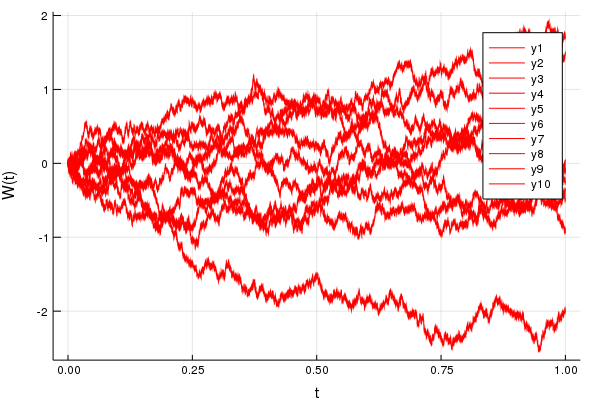

In [1]:
using Random
function bpath(T,N)
    Random.seed!(100)
    dt = T/N
    dW = zeros(10,N)
    W = zeros(10,N)

    dW[:,1] = sqrt(dt)*randn(10)
    W[:,1] = dW[:,1]

    for j = 2:N
        dW[:,j] .= sqrt(dt)*randn(10)
        W[:,j] .= W[:,j-1] .+ dW[:,j]
    end
    [0:dt:T-dt],W
end # Translation took < 1 minute
@time t,W = bpath(1,100000)
@time t,W = bpath(1,100000)
# 10x speedup over MATLAB
using Plots; gr(fmt = :png)
plot(t,W',color=:red,xlabel="t",ylabel="W(t)")

# Julia's Syntax is Concise and Mathematical

[MATLAB, Julia, Python Syntax Comparison](http://cheatsheets.quantecon.org/)

# Julia's Engineering and Design Tradeoffs

- Type structures cannot be changed after created (less dynamism but memory layout can be optimized for)
- All functions are JIT compiled via LLVM (interactive lags but massive runtime improvements)
- All functions specialize on the types of arguments (more compilation but gives generic programming structures)
- Julia is interactive (use it like MATLAB/Python/R, but makes it harder to get binaries)
- Julia has great methods for handling mutation (more optimization opportunities like C/Fortran, but more cognative burden)
- Julia's Base library and most packages are written in Julia (you can understand the source, but learn a new package)
- Julia has extensive tooling for code generation and metaprogramming (concise and more optimizations, but some codes can be for experienced users)

To me, this gives me a language with a lot of depth which works well for computationally-expensive scientific computing applications.

# Julia is about Generic Programming for Speed

## Object-Oriented Programming: R/Python/C++. Centered around building representations of data

## Type-Dispatch Programming: Julia. Centered around implementing the generic template of the algorithm, and letting the data type choose how to efficiently implement the algorithm

### Result: algorithms and packages automatically compose in an efficient way, and using the high level abstractions of the language is a proper and efficient way to design scalable codes!

In [1]:
f(x,y) = x + y
@code_llvm f(1,1)
@code_llvm f(1.0,1.0)


; Function f
; Location: In[1]:1
; Function Attrs: uwtable
define i64 @julia_f_34741(i64, i64) #0 {
top:
; Function +; {
; Location: int.jl:53
  %2 = add i64 %1, %0
;}
  ret i64 %2
}

; Function f
; Location: In[1]:1
; Function Attrs: uwtable
define double @julia_f_34744(double, double) #0 {
top:
; Function +; {
; Location: float.jl:395
  %2 = fadd double %0, %1
;}
  ret double %2
}


# DifferentialEquations.jl

DifferentialEquations.jl is the core differential equation solver package in Julia. In a nutshell, it provides solvers for:

- ODEs
- DAEs
- SODEs, SDAEs
- Discrete stochastic (Gillespie) equations, mixed with ODEs/SDEs (jump diffusions)
- DDEs
- PDEs

It provides wrappers to the common C++ and Fortran libraries, along with native Julia implementations with efficient genric algorithms.

## Case Study: Lotka-Volterra in many ways

First, the basic ODE with functions

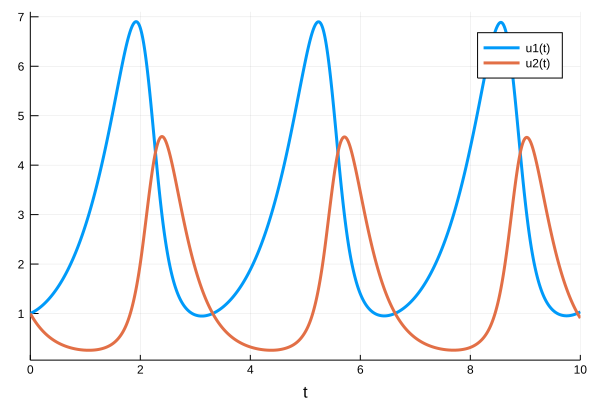

In [32]:
using DifferentialEquations
function f(du,u,p,t)
  x, y = u
  α,β,γ,δ = p
  du[1] = α*x - β*x*y
  du[2] = -γ*y + δ*x*y
end
p = (1.5,1.0,3.0,1.0); u0 = [1.0;1.0]
tspan = (0.0,10.0)
prob1 = ODEProblem(f,u0,tspan,p)
sol = solve(prob1)
using Plots; plot(sol)

## DSLs and Metaprogramming for Syntactic Sugar

Now let's use a DSL defined by a macro:

In [ ]:
f = @ode_def LotkaVolterra begin
  dx  = α*x  - β*x*y
  dy = -γ*y + δ*x*y
end α β γ δ

f = @ode_def LotkaVolterra begin
  d🐁  = α*🐁 - β*🐁*🐈
  d🐈 = -γ*🐈 + δ*🐁*🐈
end α β γ δ

sir_model = @reaction_network SIR begin
    c1, s + i --> 2i
    c2, i --> r
end c1 c2

## Using Generic Algorithms for Optimizations

Let's specialize the speed of the integrator for small array equations by utilizing static arrays

In [13]:
using StaticArrays
static_u0 = @SVector [1.0,1.0]
function f2(u,p,t)
  x, y = u
  α,β,γ,δ = p
  @SVector [α*x - β*x*y, -γ*y + δ*x*y]
end
prob2 = ODEProblem(f2,static_u0,tspan,p)
sol = solve(prob2);

In [18]:
using BenchmarkTools
@benchmark solve(prob1)

BenchmarkTools.Trial: 
  memory estimate:  66.47 KiB
  allocs estimate:  509
  --------------
  minimum time:     64.944 μs (0.00% GC)
  median time:      123.846 μs (0.00% GC)
  mean time:        166.556 μs (11.31% GC)
  maximum time:     9.024 ms (95.28% GC)
  --------------
  samples:          10000
  evals/sample:     1

In [17]:
@benchmark solve(prob2)

BenchmarkTools.Trial: 
  memory estimate:  66.83 KiB
  allocs estimate:  243
  --------------
  minimum time:     48.330 μs (0.00% GC)
  median time:      88.355 μs (0.00% GC)
  mean time:        116.859 μs (10.88% GC)
  maximum time:     8.732 ms (96.34% GC)
  --------------
  samples:          10000
  evals/sample:     1

## Optimize the Solver By Choosing from the Largest Set of Methods

http://docs.juliadiffeq.org/latest/solvers/ode_solve.html

https://github.com/JuliaDiffEq/DiffEqBenchmarks.jl

In [21]:
@benchmark solve(prob2,Vern9())

BenchmarkTools.Trial: 
  memory estimate:  56.77 KiB
  allocs estimate:  119
  --------------
  minimum time:     22.656 μs (0.00% GC)
  median time:      49.840 μs (0.00% GC)
  mean time:        62.234 μs (14.02% GC)
  maximum time:     4.155 ms (97.28% GC)
  --------------
  samples:          10000
  evals/sample:     1

In [24]:
using LSODA
@benchmark solve(prob1,lsoda()) # Default method of SciPy, deSolve, etc.

BenchmarkTools.Trial: 
  memory estimate:  63.77 KiB
  allocs estimate:  765
  --------------
  minimum time:     143.481 μs (0.00% GC)
  median time:      233.346 μs (0.00% GC)
  mean time:        278.571 μs (7.13% GC)
  maximum time:     8.286 ms (94.75% GC)
  --------------
  samples:          10000
  evals/sample:     1

## Generic Algorithms to Propogate Uncertainty

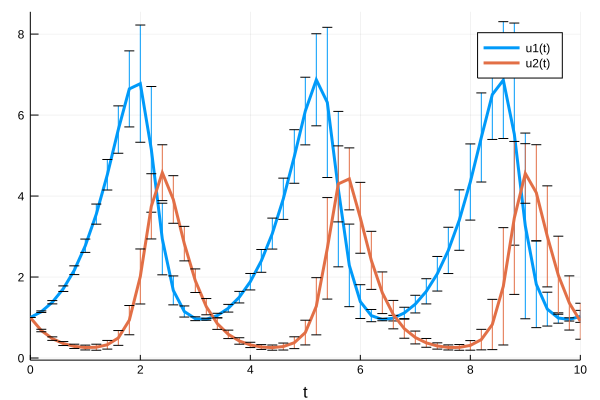

In [42]:
using Measurements
u0 = [1.0 ± 0.0 ,1.0 ± 0.0]
p = (1.5 ± 0.0,1.0 ± 0.1,3.0 ± 0.2,1.0 ± 0.1)
prob_error = ODEProblem(f,u0,tspan,p)
sol = solve(prob_error,Tsit5(), saveat=0.2)
plot(sol)

## Generic Algorithms to Calculate Sensitivities

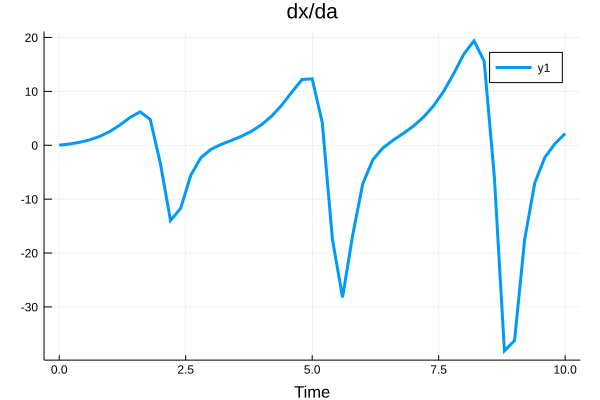

In [54]:
using ForwardDiff: Dual
p1dual = Dual{Float64}(1.5, (1.0, 0.0))
p2dual = Dual{Float64}(1.0, (0.0, 1.0))
pdual = (p1dual, p2dual, 3.0, 1.0)
u0 = [Dual{Float64}(1.0, (0.0, 0.0)),Dual{Float64}(1.0, (0.0, 0.0))]
prob_dual = ODEProblem(f,u0,tspan,pdual)
sol_dual = solve(prob_dual,Tsit5(), saveat=0.2)

timepoints = [i for i in sol_dual.t]
sensitivity_forward_diff = [i[1].partials.values[1] for i in sol_dual.u]
Plots.plot(timepoints,sensitivity_forward_diff,title="dx/da",lw=3,xaxis="Time")

## Generic Algorithms for Arbitrary Precision

In [59]:
p = big.((1.5,1.0,3.0,1.0)); u0 = big.([1.0,1.0])
tspan = big.((0.0,10.0))
prob1 = ODEProblem(f,u0,tspan,p)
sol = solve(prob1,Vern9(),abstol=1e-25,reltol=1e-25)
sol[10]

2-element Array{BigFloat,1}:
 1.010967945441596789719381858565413753168637694636043181123471126802488483367416    
 9.590701157969237149065086474592525107928794966861429243883755987604756818548128e-01

## Generic Algorithms for Units

In [62]:
using Unitful
p = (1.5,1.0,3.0,1.0)./u"s"; u0 = [1.0u"kg",1.0u"kg"]
tspan = (0.0u"s",10.0u"s")
prob_units = ODEProblem(f,u0,tspan,p)
sol = solve(prob_units,Tsit5())

Unitful.DimensionError: DimensionError: 1.5 kg s^-1 and 1.0 kg^2 s^-1 are not dimensionally compatible.

In [66]:
#= 
f = @ode_def LotkaVolterra begin
  d🐁  = α*🐁 - β*🐁*🐈
  d🐈 = -γ*🐈 + δ*🐁*🐈
end α β γ δ
=#
p = (1.5,1.0/u"kg",3.0,1.0/u"kg")./u"s"; u0 = [1.0u"kg",1.0u"kg"]
tspan = (0.0u"s",10.0u"s")
prob_units = ODEProblem(f,u0,tspan,p)
sol = solve(prob_units,Tsit5())
sol.t[10],sol[10]

(2.2640893954264825 s, Quantity{Float64,Unitful.Dimensions{(Unitful.Dimension{:Mass}(1//1),)},Unitful.FreeUnits{(Unitful.Unit{:Gram,Unitful.Dimensions{(Unitful.Dimension{:Mass}(1//1),)}}(3, 1//1),),Unitful.Dimensions{(Unitful.Dimension{:Mass}(1//1),)}}}[4.39301 kg, 4.19467 kg])

# Other Features of DifferentialEquations.jl

## The solution is a continuous function by default

In [68]:
sol(5.5u"s")

2-element Array{Quantity{Float64,Unitful.Dimensions{(Unitful.Dimension{:Mass}(1//1),)},Unitful.FreeUnits{(Unitful.Unit{:Gram,Unitful.Dimensions{(Unitful.Dimension{:Mass}(1//1),)}}(3, 1//1),),Unitful.Dimensions{(Unitful.Dimension{:Mass}(1//1),)}}},1}:
 5.338696330932268 kg
 3.608369936346481 kg

## Easily Change to Stochastic Differential Equations

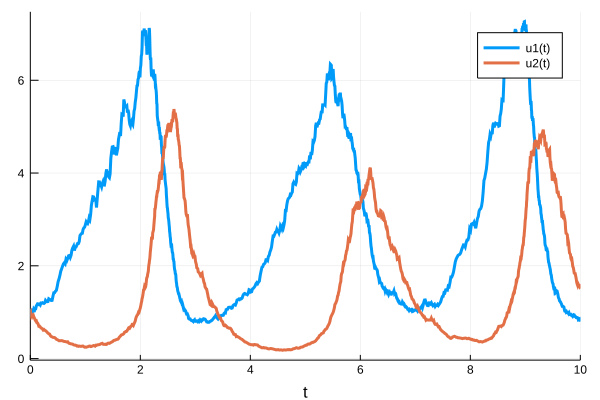

In [71]:
using DifferentialEquations
function g(du,u,p,t)
  du[1] = 0.2u[1]
  du[2] = 0.2u[2]
end
p = (1.5,1.0,3.0,1.0); u0 = [1.0;1.0]
tspan = (0.0,10.0)
prob1 = SDEProblem(f,g,u0,tspan,p)
sol = solve(prob1)
using Plots; plot(sol)

## And Delay Differential Equations

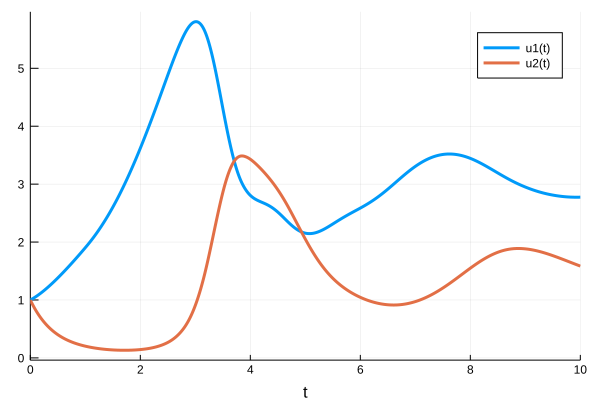

In [77]:
function f(du,u,h,p,t)
  x, y = u
  α,β,γ,δ = p
  du[1] = α*h(p,t-1)[1] - β*x*y
  du[2] = -γ*y + δ*x*y
end
p = (1.5,1.0,3.0,1.0); u0 = [1.0;1.0]
tspan = (0.0,10.0)
_h(p,t) = ones(2)
prob1 = DDEProblem(f,u0,_h,tspan,p)
sol = solve(prob1)
using Plots; plot(sol)

# Usable from R, Python, and the Web!

- diffeqr (R) : https://cran.r-project.org/web/packages/diffeqr/index.html
- diffeqpy (Python) : https://github.com/JuliaDiffEq/diffeqpy
- DifferentialEquations.jl Online (Web Browser): http://app.juliadiffeq.org/
- Interact.jl + WebAssembly.jl: Compile DifferentialEquations.jl models to the browser!

## DifferentialEquations.jl has a large active developer-base

#### Let us know what you need!